In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import tqdm
from sklearn.metrics import roc_auc_score

In [2]:
class MVTecLOCODataset(Dataset):
    def __init__(self, root_dir, split='train', anomaly_type='logical_anomalies', transform=None):
        self.transform = transform
        self.image_paths = []
        self.labels = []  # 0 for normal, 1 for anomaly

        if split == 'train':
            # Load 'good' images for training
            good_dir = os.path.join(root_dir, 'train', 'good')
            self._load_images_from_folder(good_dir, label=0)
        elif split == 'test':
            # Load 'good' and specified anomalies for testing
            good_dir = os.path.join(root_dir, 'test', 'good')
            anomaly_dir = os.path.join(root_dir, 'test', anomaly_type)
            self._load_images_from_folder(good_dir, label=0)
            self._load_images_from_folder(anomaly_dir, label=1)
        else:
            raise ValueError(f"Invalid split: {split}")

    def _load_images_from_folder(self, folder, label):
        if not os.path.isdir(folder):
            print(f"Folder {folder} is missing!")
            return
        for root, _, files in os.walk(folder):
            for file in files:
                if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(root, file)
                    self.image_paths.append(img_path)
                    self.labels.append(label)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        label = self.labels[idx]
        return image, label, img_path


In [3]:
# The Patches class in your PyTorch code corresponds to the Patches layer in the original TensorFlow code. 
# In both implementations, this class is tasked with extracting patches from an image.
# In the PyTorch implementation, you achieve this with torch.nn.Unfold
class Patches(nn.Module):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size

    def forward(self, images):
        unfold = nn.Unfold(kernel_size=self.patch_size, stride=self.patch_size)
        patches = unfold(images)
        patches = patches.transpose(1, 2)  # (batch_size, num_patches, patch_dims)
        return patches

In [4]:
#The PyTorch PatchEncoder class corresponds to the PatchEncoder layer in TensorFlow, where patches are projected 
# to a higher dimension and position embeddings are added.
#In PyTorch, you use torch.nn.Embedding for the positional embeddings and torch.nn.Linear for the patch projection.
class PatchEncoder(nn.Module):
    def __init__(self, embed_shape):
        super(PatchEncoder, self).__init__()
        self.position_embedding = nn.Embedding(embed_shape[0], embed_shape[1])
        #self.projection = nn.Linear(patches_dim, embed_shape[1])
        self.projection = nn.Linear(embed_shape[1], embed_shape[1])

    def forward(self, patches):
        batch_size, num_patches, _ = patches.size()
        #positions = torch.arange(num_patches, device=patches.device).unsqueeze(0).expand(batch_size, -1)
        positions = torch.arange(num_patches, device=patches.device).expand(batch_size, -1)
        encoded = self.projection(patches) + self.position_embedding(positions)
        return encoded

In [5]:
class PatchExpanding(nn.Module):
    def __init__(self, image_size, patch_size, num_channels):
        super(PatchExpanding, self).__init__()
        self.image_size = image_size
        self.patch_size = patch_size
        self.num_channels = num_channels

    def forward(self, patches):
        """
        patches: Tensor of shape (batch_size, num_patches, patch_dim)
        We need to reshape it back to (batch_size, C, H, W)
        """
        batch_size = patches.size(0)
        num_patches = int(self.image_size / self.patch_size)  # Calculate the number of patches per dimension

        # Reshape the patches back to their original 2D spatial grid
        patches = patches.view(batch_size, num_patches, num_patches, self.patch_size, self.patch_size, self.num_channels)
        
        # Merge patch dimensions into the full image dimensions
        expanded_image = patches.permute(0, 5, 1, 3, 2, 4).contiguous()  # (batch_size, C, num_patches, patch_size, num_patches, patch_size)
        expanded_image = expanded_image.view(batch_size, self.num_channels, self.image_size, self.image_size)  # Reshape to (batch_size, C, H, W)
        
        return expanded_image


In [6]:
class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = nn.GELU()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        x = self.drop(x)
        return x

In [7]:
class TransformerBlock(nn.Module):
    def __init__(self, embed_shape, num_heads, dropout):
        super(TransformerBlock, self).__init__()
        self.attn = nn.MultiheadAttention(embed_shape[1], num_heads, dropout=dropout)
        self.norm1 = nn.LayerNorm(embed_shape[1])
        self.mlp = Mlp(embed_shape[1], hidden_features=4 * embed_shape[1], drop=dropout)
        self.norm2 = nn.LayerNorm(embed_shape[1])

        self.decoder_attn1 = nn.MultiheadAttention(embed_dim=embed_shape[1], num_heads=num_heads)

        #attn_out, _ = nn.MultiheadAttention(embed_dim=embed_shape[1], num_heads=num_heads)(target, target, target)
        

    def forward(self, x):
        attn_output, _ = self.attn(x, x, x)
        x = x + attn_output
        x = self.norm1(x)
        mlp_output = self.mlp(x)
        x = x + mlp_output
        x = self.norm2(x)
        return x

In [8]:
# class DCAE(nn.Module):
#     def __init__(self, num_channels=3):
#         super(DCAE, self).__init__()
        
#         # Encoder (with feature maps to be used for skip connections)
#         self.encoder_conv1 = nn.Conv2d(num_channels, 32, 3, stride=2, padding=1)
#         self.encoder_conv2 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
#         self.encoder_conv3 = nn.Conv2d(64, 128, 3, stride=2, padding=1)
#         self.encoder_conv4 = nn.Conv2d(128, 128, 3, stride=2, padding=1)
#         self.encoder_conv5 = nn.Conv2d(128, 16, 1)
        
#         self.leaky_relu = nn.LeakyReLU()

#         # Fully connected layers
#         self.fc1 = nn.Linear(16 * 16 * 16, 512)  # Input size matches bottleneck
#         self.fc2 = nn.Linear(512, 16 * 16 * 16)

#         # Decoder (with deconvolutional layers for upsampling)
#         self.decoder_deconv1 = nn.ConvTranspose2d(16, 128, 3, stride=2, padding=1, output_padding=1)  # Upsampling
#         self.decoder_deconv2 = nn.ConvTranspose2d(128, 128, 3, stride=2, padding=1, output_padding=1)
#         self.decoder_deconv3 = nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1)
#         self.decoder_deconv4 = nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1)
#         self.decoder_deconv5 = nn.Conv2d(32, num_channels, 1)  # Final layer to match channel size

#     def forward(self, x):
#         # Encoder with skip connections
#         x1 = self.leaky_relu(self.encoder_conv1(x))  # First layer (H/2, W/2, 32)
#         x2 = self.leaky_relu(self.encoder_conv2(x1))  # Second layer (H/4, W/4, 64)
#         x3 = self.leaky_relu(self.encoder_conv3(x2))  # Third layer (H/8, W/8, 128)
#         x4 = self.leaky_relu(self.encoder_conv4(x3))  # Fourth layer (H/16, W/16, 128)
#         x5 = self.leaky_relu(self.encoder_conv5(x4))  # Bottleneck (H/16, W/16, 16)
        
#         # Flatten the bottleneck layer and pass through fully connected layers
#         x_flat = x5.view(x.size(0), -1)
#         x_flat = self.leaky_relu(self.fc1(x_flat))  # Fully connected bottleneck (512,)
#         x_flat = self.leaky_relu(self.fc2(x_flat))  # Upsample back to image space
        
#         # Reshape to image dimensions (16, 16, 16)
#         x_unflat = x_flat.view(x.size(0), 16, 16, 16)
        
#         # Decoder with skip connections
#         # Pass each decoder stage the corresponding skip connection from the encoder
#         x_unflat = self.leaky_relu(self.decoder_deconv1(x_unflat))  # First upsampling (H/16, W/16, 128)
#         x_unflat = self.leaky_relu(self.decoder_deconv2(x_unflat + x4))  # Skip connection (H/8, W/8, 128)
#         x_unflat = self.leaky_relu(self.decoder_deconv3(x_unflat + x3))  # Skip connection (H/4, W/4, 64)
#         x_unflat = self.leaky_relu(self.decoder_deconv4(x_unflat + x2))  # Skip connection (H/2, W/2, 32)
#         x_unflat = self.decoder_deconv5(x_unflat + x1)  # Final reconstruction

#         return x_unflat


In [9]:
class DCAE(nn.Module):
    def __init__(self, num_channels=3):
        super(DCAE, self).__init__()
        
        # Encoder (with feature maps to be used for skip connections)
        self.encoder_conv1 = nn.Conv2d(num_channels, 32, 3, stride=2, padding=1)
        self.encoder_conv2 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.encoder_conv3 = nn.Conv2d(64, 128, 3, stride=2, padding=1)
        self.encoder_conv4 = nn.Conv2d(128, 128, 3, stride=2, padding=1)
        self.encoder_conv5 = nn.Conv2d(128, 16, 1)

        self.leaky_relu = nn.LeakyReLU(inplace=False)

        # Fully connected layers
        self.fc1 = nn.Linear(16 * 64 * 64, 512)
        self.fc2 = nn.Linear(512, 16 * 64 * 64)

        # Decoder (with deconvolutional layers for upsampling)
        self.decoder_deconv1 = nn.ConvTranspose2d(16, 128, 3, stride=2, padding=1, output_padding=1)  # Upsampling
        self.decoder_deconv2 = nn.ConvTranspose2d(128, 128, 3, stride=2, padding=1, output_padding=1)
        self.decoder_deconv3 = nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1)
        self.decoder_deconv4 = nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1)
        self.decoder_deconv5 = nn.Conv2d(32, num_channels, 1)  # Final layer to match channel size

    def forward(self, x):
        # Encoder with skip connections
        x1 = self.leaky_relu(self.encoder_conv1(x))  # First layer (H/2, W/2, 32)
        x2 = self.leaky_relu(self.encoder_conv2(x1))  # Second layer (H/4, W/4, 64)
        x3 = self.leaky_relu(self.encoder_conv3(x2))  # Third layer (H/8, W/8, 128)
        x4 = self.leaky_relu(self.encoder_conv4(x3))  # Fourth layer (H/16, W/16, 128)
        x5 = self.leaky_relu(self.encoder_conv5(x4))  # Bottleneck (H/16, W/16, 16)
        
        # Flatten the bottleneck layer and pass through fully connected layers
        x_flat = x5.view(x.size(0), -1)
        x_flat = self.leaky_relu(self.fc1(x_flat))  # Fully connected bottleneck (512,)
        x_flat = self.leaky_relu(self.fc2(x_flat))  # Upsample back to image space
        
        # Reshape to image dimensions (16, 64, 64)
        x_unflat = x_flat.view(x.size(0), 16, 64, 64)
        
        # Decoder with skip connections
        x_unflat = self.leaky_relu(self.decoder_deconv1(x_unflat))  # First upsampling (H/32, W/32, 128)

        # **Fix**: Upsample `x4` to match the spatial dimensions of `x_unflat`
        x4_upsampled = nn.functional.interpolate(x4, size=(128, 128), mode='nearest')

        x_unflat = self.leaky_relu(self.decoder_deconv2(x_unflat + x4_upsampled))  # Skip connection (H/16, W/16, 128)
        
        # Perform the same upsampling for x3 and x2
        x3_upsampled = nn.functional.interpolate(x3, size=(256, 256), mode='nearest')
        x_unflat = self.leaky_relu(self.decoder_deconv3(x_unflat + x3_upsampled))  # Skip connection (H/8, W/8, 64)

        x2_upsampled = nn.functional.interpolate(x2, size=(512, 512), mode='nearest')
        x_unflat = self.leaky_relu(self.decoder_deconv4(x_unflat + x2_upsampled))  # Skip connection (H/4, W/4, 32)
        
        x1_upsampled = nn.functional.interpolate(x1, size=(1024, 1024), mode='nearest')
        x_unflat = self.decoder_deconv5(x_unflat + x1_upsampled)  # Final reconstruction (H, W, num_channels)

        return x_unflat


In [10]:
class TransformerAutoencoder(nn.Module):
    def __init__(self, image_size, patch_size, num_channels, embed_shape, num_heads, transformer_layers, dropout=0.1):
        super(TransformerAutoencoder, self).__init__()

        #Patch extraction
        self.patches = Patches(patch_size)

        #Patch embedding
        self.patch_encoder = PatchEncoder(embed_shape)
        
        #Transformer blocks
        self.transformer_layers = nn.ModuleList([
            TransformerBlock(embed_shape, num_heads, dropout) for _ in range(transformer_layers)
        ])

        # Patch Expanding - this will reassemble patches into the image grid
        self.patch_expanding = PatchExpanding(image_size, patch_size, num_channels)
        
        # Convolutional Autoencoder
        self.conv_autoencoder = DCAE(num_channels=num_channels)

        # Positional Embeddings
        self.pos_embedding = nn.Embedding(embed_shape[0], embed_shape[1])

        #DECODER SIDE TRANSFORMER
        self.decoder_attn1 = nn.MultiheadAttention(embed_dim=embed_shape[1], num_heads=num_heads)
        self.decoder_norm1 = nn.LayerNorm(embed_shape[1])

        self.decoder_attn2 = nn.MultiheadAttention(embed_dim=embed_shape[1], num_heads=num_heads)
        self.decoder_norm2 = nn.LayerNorm(embed_shape[1])

        self.decoder_mlp_fn = Mlp(in_features=embed_shape[1], hidden_features=4 * embed_shape[1], drop=dropout)
        self.decoder_norm_fn = nn.LayerNorm(embed_shape[1])

        # Patch Expanding - this will reassemble patches into the image grid
        self.patch_expanding_fn = PatchExpanding(image_size, patch_size, num_channels)

    def forward(self, x):
        #1 Patch extraction
        patches = self.patches(x)
        #2 Patch embedding
        encoded_patches = self.patch_encoder(patches)

        # 2. First round of transformer blocks (Self-Attention + MLP)
        for transformer in self.transformer_layers:
            encoded_patches = transformer(encoded_patches)

        expanded_image = self.patch_expanding(encoded_patches)

        # 3. Reconstruct image from patches using convolutional autoencoder
        # Convert encoded patches back to image space
        decoded_img = self.conv_autoencoder(expanded_image)

        # 4. Re-apply patches after autoencoder
        decoded_img_patches = self.patches(decoded_img)
        encoded_patches_fn = self.patch_encoder(decoded_img_patches)

        # 5. Positional Embeddings
        # positions = torch.arange(encoded_patches_fn.shape[1], device=encoded_patches_fn.device)
        # pos_embed = self.pos_embedding(positions).unsqueeze(0)

        # 6. Second round of transformer blocks with Positional Embeddings
        #target = encoded_patches_fn + pos_embed
        target = encoded_patches_fn

        # Add positional embeddings to target
        # target += pos_embed

        # First attention mechanism
        attn_out, _ = self.decoder_attn1(target, target, target)
        target = target + attn_out
        target = self.decoder_norm1(target)


        # Second attention mechanism
        #Why are you adding pos_embed to target, pos_embed to encoded_patches and why is the reason behind this order of parameters
        attn_out_2, _ = self.decoder_attn2(target, encoded_patches_fn, encoded_patches_fn)
        target = target + attn_out_2
        target = self.decoder_norm2(target)

        #ffn_out = self.decoder_mlp(encoded_patches) chatgpt suggested
        # MLP/Feed-forward layer
        ffn_out = self.decoder_mlp_fn(target) #My suggestion
        target = target + ffn_out

        target = self.decoder_norm_fn(target)
                    
        image = self.patch_expanding(target)
        return image

In [11]:
from sklearn.metrics import roc_auc_score

def evaluate(model, dataloader, device):
    model.eval()
    all_labels = []
    all_scores = []
    
    with torch.no_grad():
        for images, labels, _ in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            
            # Forward pass
            reconstructed = model(images)
            reconstruction_error = nn.functional.mse_loss(reconstructed, images, reduction='none')
            reconstruction_error = reconstruction_error.mean(dim=(1, 2, 3))  # Reduce across spatial dimensions

            # Collect labels and scores
            all_labels.extend(labels.cpu().numpy())
            all_scores.extend(reconstruction_error.cpu().numpy())
    
    # Compute AUROC
    auroc = roc_auc_score(all_labels, all_scores)
    return auroc


In [12]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_reconstruction(model, dataloader, device):
    model.eval()
    images, labels, paths = next(iter(dataloader))  # Get a batch of images
    images = images.to(device)
    
    with torch.no_grad():
        reconstructed = model(images)  # Reconstruct the images

    images = images.cpu().numpy().transpose(0, 2, 3, 1)  # Change from CHW to HWC format
    reconstructed = reconstructed.cpu().numpy().transpose(0, 2, 3, 1)

    # Rescale images from [-1, 1] to [0, 1]
    images = (images * 0.5) + 0.5  # Assuming images were normalized with mean=0.5, std=0.5
    reconstructed = (reconstructed * 0.5) + 0.5

    # Ensure the pixel values are clipped between 0 and 1
    images = np.clip(images, 0, 1)
    reconstructed = np.clip(reconstructed, 0, 1)

    n = min(len(images), 4)  # Visualize the first 4 images
    plt.figure(figsize=(12, 6))
    for i in range(n):
        # Original Image
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(images[i])
        ax.axis('off')
        ax.set_title("Original")

        # Reconstructed Image
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed[i])
        ax.axis('off')
        ax.set_title("Reconstructed")
    
    plt.show()


In [13]:
# Loss function: Mean Squared Error (MSE)
criterion = nn.MSELoss()

In [14]:
def train(model, train_loader, optimizer, criterion, device):
    model.train()  # Set model to training mode
    total_loss = 0
    progress_bar = tqdm.tqdm(train_loader, desc="Training", unit="batch")
    
    for images, labels, _ in progress_bar:
        images = images.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        reconstructed = model(images)
        loss = criterion(reconstructed, images)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        # Accumulate the loss
        total_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    # Return average loss over all batches
    return total_loss / len(train_loader)


No checkpoint found at 'checkpoint.pth'


Training: 100%|██████████| 45/45 [01:58<00:00,  2.63s/batch, loss=1.33]


Epoch 1/500, Train Loss: 1.355277, Test AUROC: 0.5875


Training: 100%|██████████| 45/45 [01:58<00:00,  2.63s/batch, loss=1.29]


Epoch 2/500, Train Loss: 1.314549, Test AUROC: 0.5885


Training: 100%|██████████| 45/45 [01:57<00:00,  2.62s/batch, loss=1.27]


Epoch 3/500, Train Loss: 1.303779, Test AUROC: 0.5850


Training: 100%|██████████| 45/45 [02:00<00:00,  2.68s/batch, loss=1.27]


Epoch 4/500, Train Loss: 1.273250, Test AUROC: 0.5810


Training: 100%|██████████| 45/45 [01:58<00:00,  2.63s/batch, loss=1.25]


Epoch 5/500, Train Loss: 1.249823, Test AUROC: 0.5833


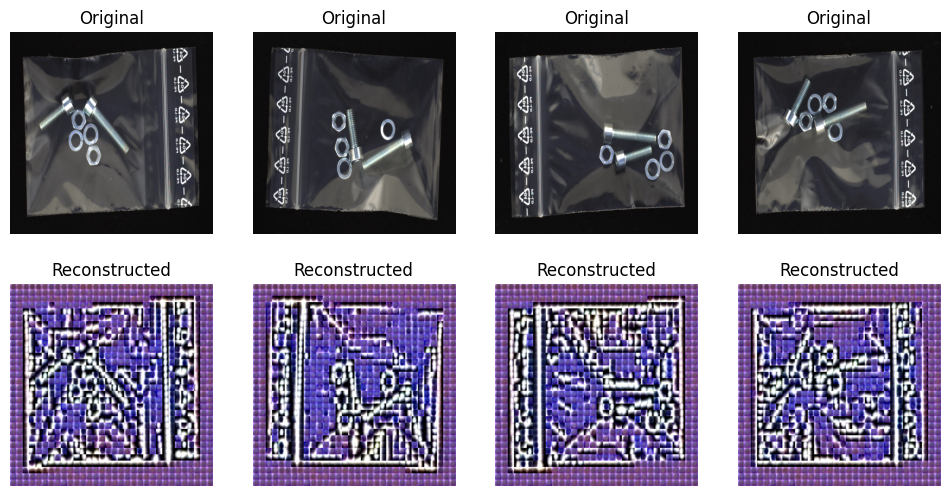

Training: 100%|██████████| 45/45 [01:59<00:00,  2.65s/batch, loss=1.23]


Epoch 6/500, Train Loss: 1.230561, Test AUROC: 0.5851


Training: 100%|██████████| 45/45 [01:57<00:00,  2.62s/batch, loss=1.2] 


Epoch 7/500, Train Loss: 1.206781, Test AUROC: 0.5856


Training: 100%|██████████| 45/45 [03:25<00:00,  4.56s/batch, loss=1.15]


Epoch 8/500, Train Loss: 1.183295, Test AUROC: 0.5859


Training: 100%|██████████| 45/45 [03:34<00:00,  4.76s/batch, loss=1.13]


Epoch 9/500, Train Loss: 1.161758, Test AUROC: 0.5845


Training: 100%|██████████| 45/45 [03:33<00:00,  4.74s/batch, loss=1.13]


Epoch 10/500, Train Loss: 1.141074, Test AUROC: 0.5847


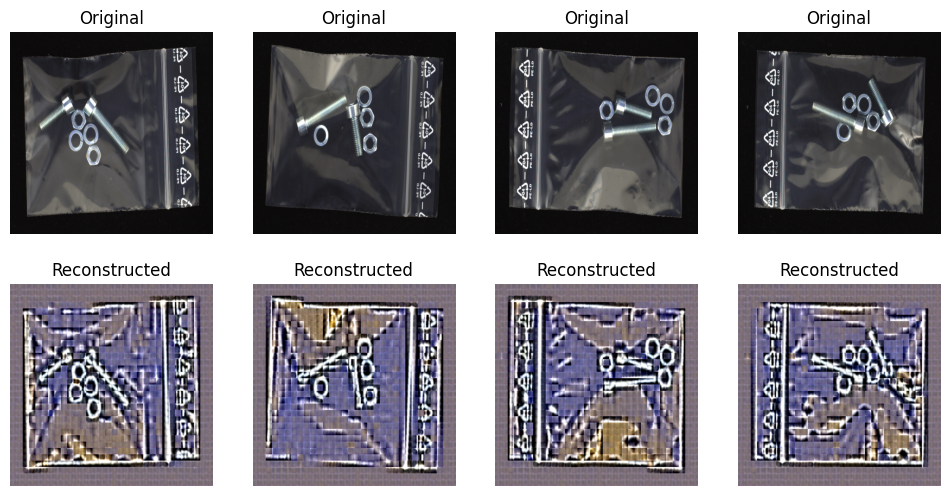

Training: 100%|██████████| 45/45 [03:32<00:00,  4.72s/batch, loss=1.12]


Epoch 11/500, Train Loss: 1.121440, Test AUROC: 0.5845


Training: 100%|██████████| 45/45 [03:34<00:00,  4.76s/batch, loss=1.1] 


Epoch 12/500, Train Loss: 1.104241, Test AUROC: 0.5859


Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=1.08]


Epoch 13/500, Train Loss: 1.088378, Test AUROC: 0.5863


Training: 100%|██████████| 45/45 [01:55<00:00,  2.58s/batch, loss=1.06]


Epoch 14/500, Train Loss: 1.073011, Test AUROC: 0.5852


Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=1.05]


Epoch 15/500, Train Loss: 1.058128, Test AUROC: 0.5871


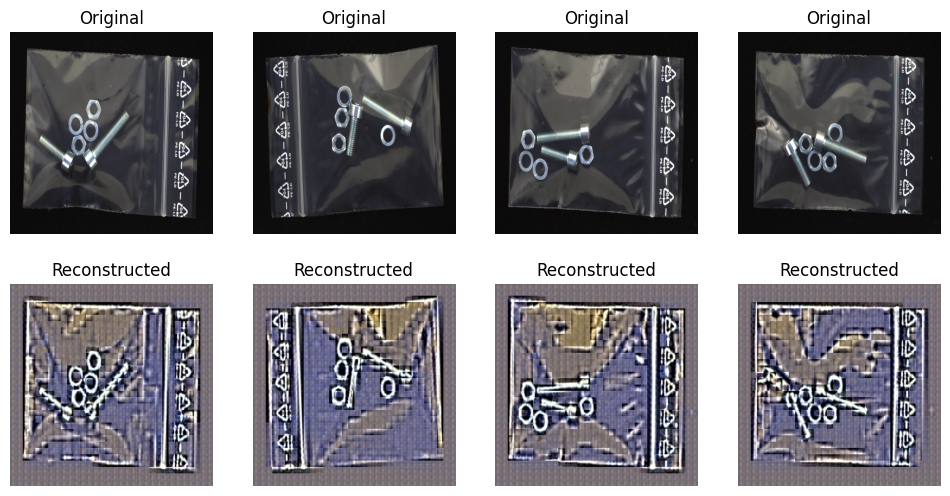

Training: 100%|██████████| 45/45 [01:56<00:00,  2.60s/batch, loss=1.03]


Epoch 16/500, Train Loss: 1.043511, Test AUROC: 0.5853


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=1.03]


Epoch 17/500, Train Loss: 1.029498, Test AUROC: 0.5863


Training: 100%|██████████| 45/45 [01:57<00:00,  2.61s/batch, loss=1.01] 


Epoch 18/500, Train Loss: 1.016229, Test AUROC: 0.5852


Training: 100%|██████████| 45/45 [02:00<00:00,  2.67s/batch, loss=0.999]


Epoch 19/500, Train Loss: 1.002987, Test AUROC: 0.5865


Training: 100%|██████████| 45/45 [01:56<00:00,  2.60s/batch, loss=0.984]


Epoch 20/500, Train Loss: 0.990335, Test AUROC: 0.5856


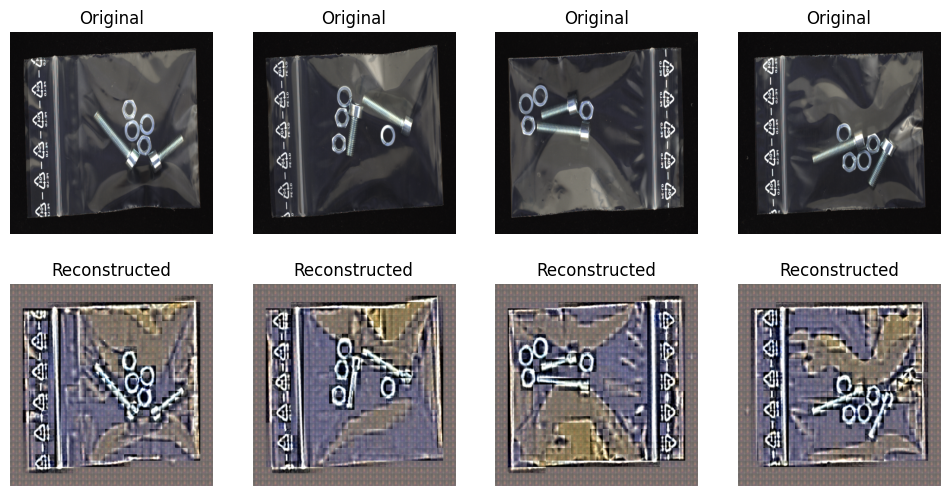

Training: 100%|██████████| 45/45 [01:56<00:00,  2.60s/batch, loss=0.975]


Epoch 21/500, Train Loss: 0.977993, Test AUROC: 0.5854


Training: 100%|██████████| 45/45 [01:56<00:00,  2.60s/batch, loss=0.956]


Epoch 22/500, Train Loss: 0.965745, Test AUROC: 0.5857


Training: 100%|██████████| 45/45 [01:57<00:00,  2.60s/batch, loss=0.944]


Epoch 23/500, Train Loss: 0.953810, Test AUROC: 0.5853


Training: 100%|██████████| 45/45 [01:57<00:00,  2.60s/batch, loss=0.933]


Epoch 24/500, Train Loss: 0.941939, Test AUROC: 0.5849


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.927]


Epoch 25/500, Train Loss: 0.930277, Test AUROC: 0.5846


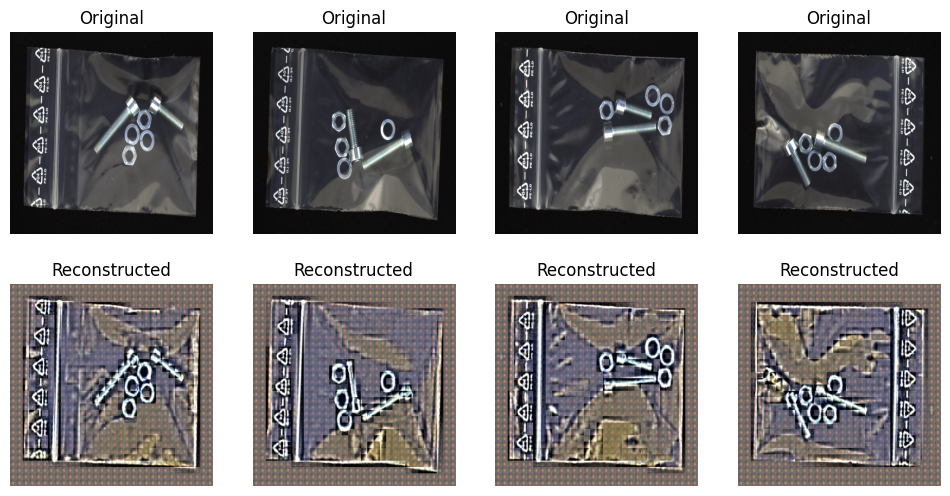

Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.911]


Epoch 26/500, Train Loss: 0.918607, Test AUROC: 0.5851


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.891]


Epoch 27/500, Train Loss: 0.900480, Test AUROC: 0.5829


Training: 100%|██████████| 45/45 [01:57<00:00,  2.60s/batch, loss=0.853]


Epoch 28/500, Train Loss: 0.863987, Test AUROC: 0.5821


Training: 100%|██████████| 45/45 [01:57<00:00,  2.60s/batch, loss=0.828]


Epoch 29/500, Train Loss: 0.838727, Test AUROC: 0.5814


Training: 100%|██████████| 45/45 [01:56<00:00,  2.60s/batch, loss=0.818]


Epoch 30/500, Train Loss: 0.818632, Test AUROC: 0.5802


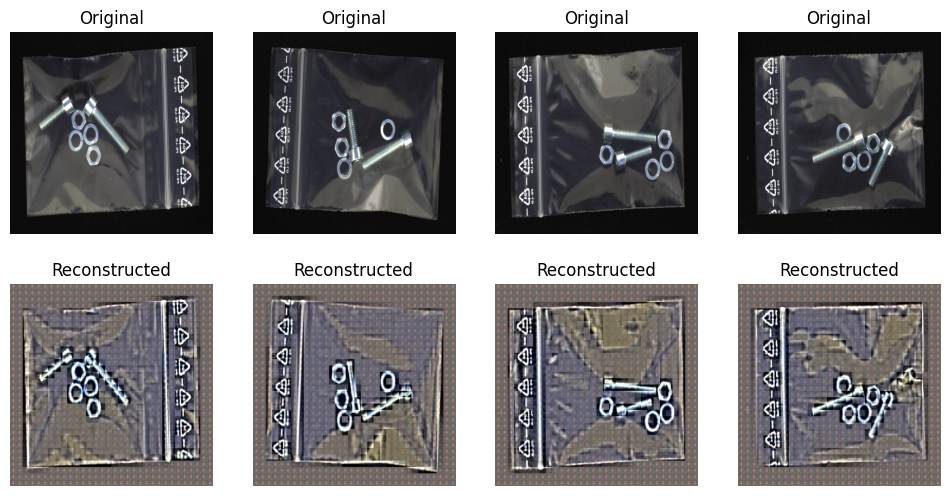

Training: 100%|██████████| 45/45 [01:57<00:00,  2.61s/batch, loss=0.801]


Epoch 31/500, Train Loss: 0.801237, Test AUROC: 0.5796


Training: 100%|██████████| 45/45 [01:57<00:00,  2.61s/batch, loss=0.775]


Epoch 32/500, Train Loss: 0.785420, Test AUROC: 0.5791


Training: 100%|██████████| 45/45 [01:57<00:00,  2.61s/batch, loss=0.767]


Epoch 33/500, Train Loss: 0.770807, Test AUROC: 0.5783


Training: 100%|██████████| 45/45 [01:57<00:00,  2.62s/batch, loss=0.76] 


Epoch 34/500, Train Loss: 0.757073, Test AUROC: 0.5776


Training: 100%|██████████| 45/45 [01:57<00:00,  2.61s/batch, loss=0.733]


Epoch 35/500, Train Loss: 0.744055, Test AUROC: 0.5784


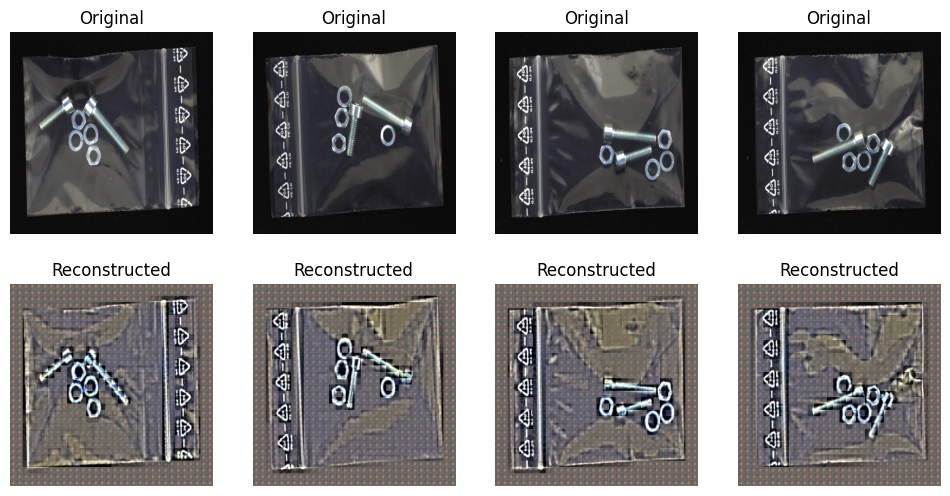

Training: 100%|██████████| 45/45 [02:00<00:00,  2.67s/batch, loss=0.72] 


Epoch 36/500, Train Loss: 0.731553, Test AUROC: 0.5766


Training: 100%|██████████| 45/45 [02:13<00:00,  2.97s/batch, loss=0.712]


Epoch 37/500, Train Loss: 0.719569, Test AUROC: 0.5777


Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=0.718]


Epoch 38/500, Train Loss: 0.707922, Test AUROC: 0.5777


Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=0.688]


Epoch 39/500, Train Loss: 0.696662, Test AUROC: 0.5786


Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=0.673]


Epoch 40/500, Train Loss: 0.685692, Test AUROC: 0.5783


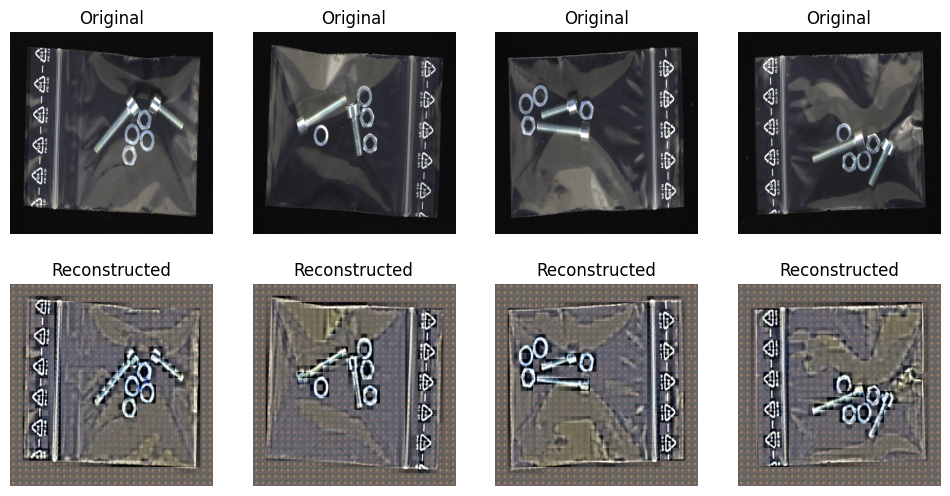

Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=0.678]


Epoch 41/500, Train Loss: 0.675060, Test AUROC: 0.5781


Training: 100%|██████████| 45/45 [01:55<00:00,  2.58s/batch, loss=0.667]


Epoch 42/500, Train Loss: 0.664686, Test AUROC: 0.5781


Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=0.651]


Epoch 43/500, Train Loss: 0.654530, Test AUROC: 0.5780


Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=0.637]


Epoch 44/500, Train Loss: 0.644590, Test AUROC: 0.5786


Training: 100%|██████████| 45/45 [01:55<00:00,  2.58s/batch, loss=0.62] 


Epoch 45/500, Train Loss: 0.634874, Test AUROC: 0.5790


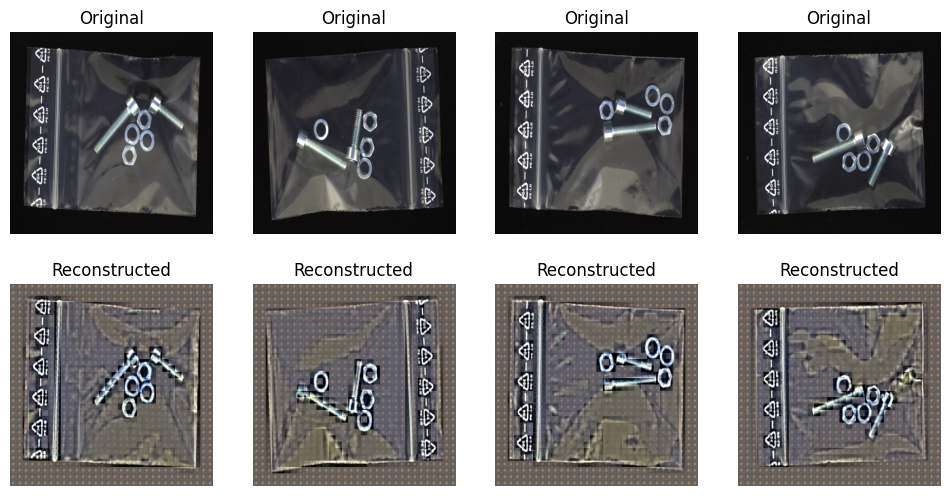

Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.623]


Epoch 46/500, Train Loss: 0.625331, Test AUROC: 0.5783


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.611]


Epoch 47/500, Train Loss: 0.616023, Test AUROC: 0.5792


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.607]


Epoch 48/500, Train Loss: 0.606815, Test AUROC: 0.5777


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.599]


Epoch 49/500, Train Loss: 0.597832, Test AUROC: 0.5783


Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=0.58] 


Epoch 50/500, Train Loss: 0.588929, Test AUROC: 0.5784


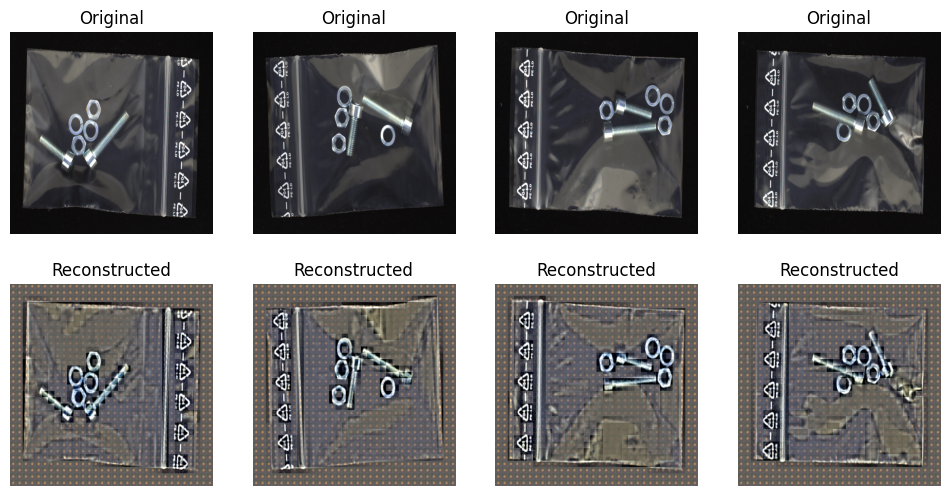

Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=0.577]


Epoch 51/500, Train Loss: 0.580204, Test AUROC: 0.5789


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.566]


Epoch 52/500, Train Loss: 0.571594, Test AUROC: 0.5790


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.57] 


Epoch 53/500, Train Loss: 0.563120, Test AUROC: 0.5792


Training: 100%|██████████| 45/45 [01:57<00:00,  2.61s/batch, loss=0.546]


Epoch 54/500, Train Loss: 0.554793, Test AUROC: 0.5792


Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=0.537]


Epoch 55/500, Train Loss: 0.546578, Test AUROC: 0.5804


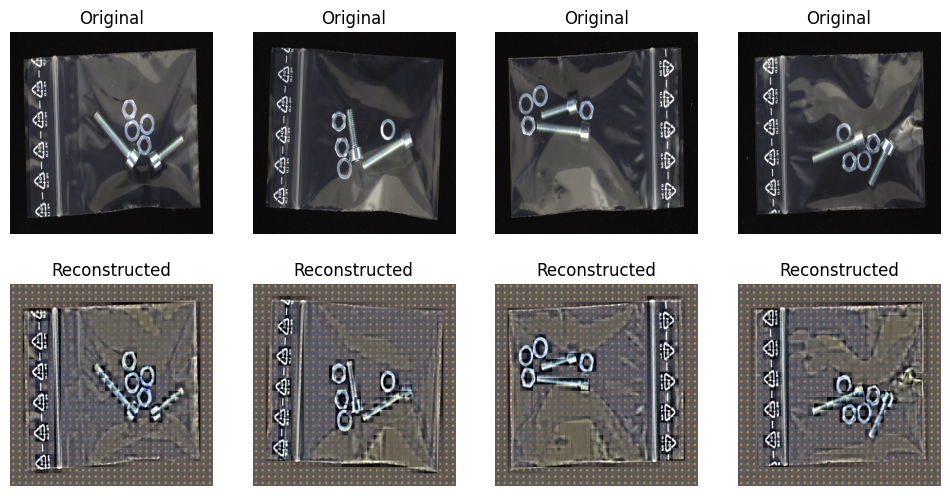

Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=0.533]


Epoch 56/500, Train Loss: 0.538424, Test AUROC: 0.5808


Training: 100%|██████████| 45/45 [01:56<00:00,  2.60s/batch, loss=0.53] 


Epoch 57/500, Train Loss: 0.530432, Test AUROC: 0.5799


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.518]


Epoch 58/500, Train Loss: 0.522511, Test AUROC: 0.5811


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.522]


Epoch 59/500, Train Loss: 0.514709, Test AUROC: 0.5804


Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=0.508]


Epoch 60/500, Train Loss: 0.506968, Test AUROC: 0.5817


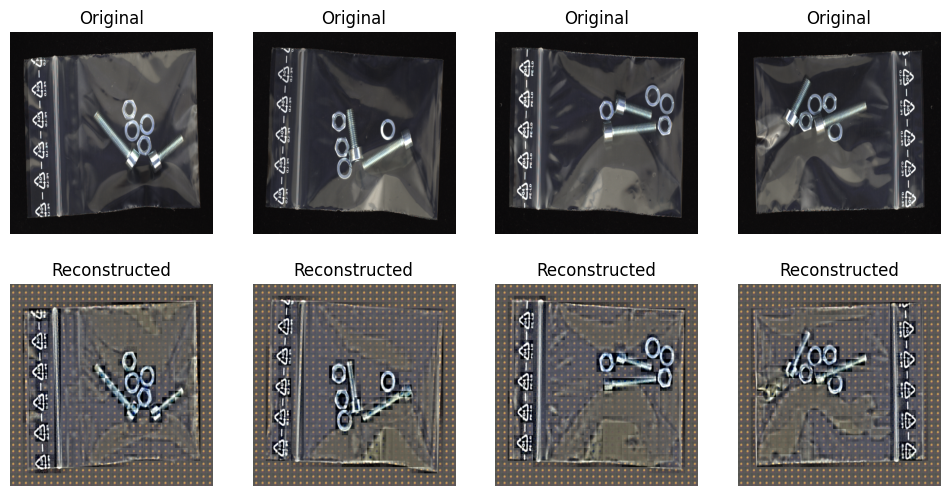

Training: 100%|██████████| 45/45 [01:56<00:00,  2.58s/batch, loss=0.497]


Epoch 61/500, Train Loss: 0.499308, Test AUROC: 0.5801


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.486]


Epoch 62/500, Train Loss: 0.491839, Test AUROC: 0.5812


Training: 100%|██████████| 45/45 [01:56<00:00,  2.60s/batch, loss=0.478]


Epoch 63/500, Train Loss: 0.484221, Test AUROC: 0.5812


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.477]


Epoch 64/500, Train Loss: 0.476748, Test AUROC: 0.5824


Training: 100%|██████████| 45/45 [01:56<00:00,  2.59s/batch, loss=0.459]


Epoch 65/500, Train Loss: 0.469258, Test AUROC: 0.5818


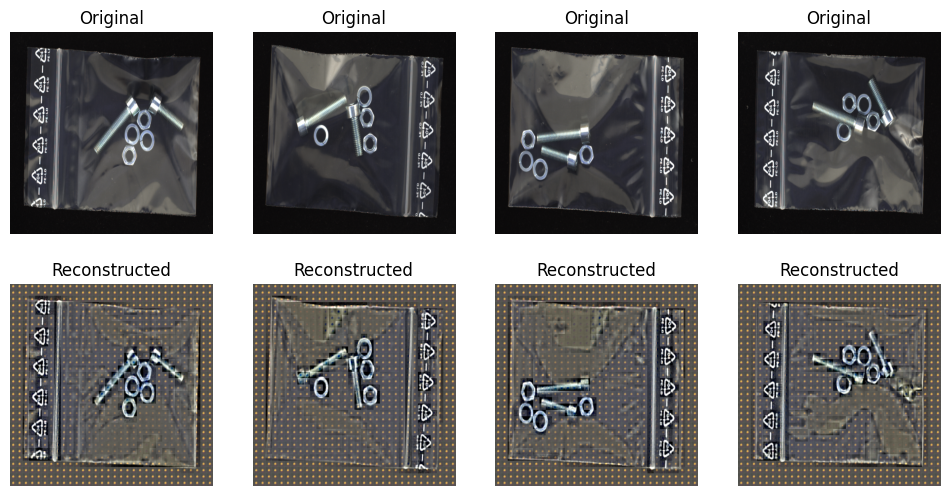

Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=0.461]


Epoch 66/500, Train Loss: 0.461730, Test AUROC: 0.5823


Training: 100%|██████████| 45/45 [01:55<00:00,  2.56s/batch, loss=0.452]


Epoch 67/500, Train Loss: 0.453730, Test AUROC: 0.5820


Training: 100%|██████████| 45/45 [01:55<00:00,  2.57s/batch, loss=0.49] 


Epoch 68/500, Train Loss: 0.485711, Test AUROC: 0.5371


Training: 100%|██████████| 45/45 [01:55<00:00,  2.56s/batch, loss=0.451]


Epoch 69/500, Train Loss: 0.468761, Test AUROC: 0.5429


Training:  38%|███▊      | 17/45 [00:45<01:15,  2.71s/batch, loss=0.443]


KeyboardInterrupt: 

In [15]:
def main():
    # Hyperparameters
    img_size = 1024
    patch_size = 32
    num_channels = 3
    filters = 256
    transformer_layers = 2
    num_heads = 8
    batch_size = 8
    num_epochs = 500
    learning_rate = 1e-4
    ROOT_DIR = "/home/hafiz/my_thesis/seg_recons/dataset/screw_bag"  # Update this path
    device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')

    # Data Transformations
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5]*3, std=[0.5]*3),
    ])

    # Datasets and Data Loaders
    train_dataset = MVTecLOCODataset(root_dir=ROOT_DIR, split='train', transform=transform)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = MVTecLOCODataset(root_dir=ROOT_DIR, split='test', transform=transform)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Initialize Model
    embed_shape = (img_size // patch_size) ** 2, patch_size * patch_size * num_channels
    model = TransformerAutoencoder(
        image_size=img_size,
        patch_size=patch_size,
        num_channels=num_channels,
        embed_shape=embed_shape,
        num_heads=num_heads,
        transformer_layers=transformer_layers,
        dropout=0.1
    ).to(device)

    # Optimizer and Loss Function
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()

    # Load saved model and optimizer states if available
    checkpoint_path = 'checkpoint.pth'  # Update with correct path
    if os.path.isfile(checkpoint_path):
        print(f"Loading checkpoint from '{checkpoint_path}'")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint['epoch'] + 1
        print(f"Resuming training from epoch {start_epoch}")
    else:
        print(f"No checkpoint found at '{checkpoint_path}'")
        start_epoch = 0

    # Training Loop
    for epoch in range(start_epoch, start_epoch + num_epochs):
        train_loss = train(model, train_loader, optimizer, criterion, device)
        auroc = evaluate(model, test_loader, device)

        print(f"Epoch {epoch+1}/{start_epoch + num_epochs}, Train Loss: {train_loss:.6f}, Test AUROC: {auroc:.4f}")

        # Visualize reconstructed images every 5 epochs
        if (epoch + 1) % 5 == 0:
            visualize_reconstruction(model, test_loader, device)

        # Save model checkpoint every 25 epochs
        if (epoch + 1) % 25 == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
            }, f'checkpoint_epoch_{epoch+1}.pth')

    # Save the final model and optimizer states
    torch.save(model.state_dict(), 'model_final.pth')
    torch.save(optimizer.state_dict(), 'optimizer_final.pth')


if __name__ == "__main__":
    main()
